# I. CHARGEMENT DES LIBRAIRIES ET IMPORTATION DU JEU DE DONNEES

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sb 
from sklearn.compose import make_column_transformer

# les méthodes de prétraitement

from sklearn.preprocessing import StandardScaler, OneHotEncoder,LabelEncoder,OrdinalEncoder

# les models de machine learning pour la situation

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier,BaggingClassifier,AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import  confusion_matrix, classification_report

#from xgboost import XGBCClassifier
#import pip
#pip.main(['install','xgboost'])
import warnings 
warnings.filterwarnings('ignore')

- CHARGEMENT DU JEU DE DONNNEES

In [2]:
df=pd.read_csv("dataset.csv",sep=";",na_values="Unknown")

In [3]:
df

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,...,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,710638233,Attrited Customer,41,M,2,NaN,Divorced,$40K - $60K,Blue,25,...,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,...,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,717406983,Attrited Customer,30,M,2,Graduate,NaN,$40K - $60K,Blue,36,...,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000


# II.ANALYSE EXPLORATOIRE

   -  ANALYSE DE LA FORME 

In [4]:
#Liste des variables
df.columns

Index(['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Gender',
       'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

-liste des variables des données:

Attrition_Flag, Customer_Age, Gender, 'Dependent_count', 'Education_Level', 'Marital_Status','Income_Category', 'Card_Category', 'Months_on_book','Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal','Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1',Total_Trans_Amt','Total_Trans_Ct','Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio

-variable cible: Attrition_Flag 

la variable  CLIENTNUM est le numero du client,elle n'a pas  d'apport dans la prédiction du
modele nous la supprimons 

In [5]:
df=df.drop('CLIENTNUM',axis=1)

In [6]:
df

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,Attrited Customer,41,M,2,NaN,Divorced,$40K - $60K,Blue,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,Attrited Customer,30,M,2,Graduate,NaN,$40K - $60K,Blue,36,4,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000


In [7]:
df.loc[415,'Attrition_Flag']
df.loc[10124,'Attrition_Flag']

'Attrited Customer'

In [8]:
#Taille du jeu de donnée
df.shape

(10127, 20)

-c'est un jeu de donnée comportant 21 caracteristiques de 10127 individu d'une banque

In [9]:
#Type de variable
df.select_dtypes(include='object').columns

Index(['Attrition_Flag', 'Gender', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category'],
      dtype='object')

In [10]:
df.select_dtypes(include='number').columns

Index(['Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

In [11]:
df.dtypes.value_counts()

int64      9
object     6
float64    5
dtype: int64

In [12]:
#Données manquantes
(df.isna().sum()/len(df))*100

Attrition_Flag               0.000000
Customer_Age                 0.000000
Gender                       0.000000
Dependent_count              0.000000
Education_Level             14.999506
Marital_Status               7.396070
Income_Category             10.980547
Card_Category                0.000000
Months_on_book               0.000000
Total_Relationship_Count     0.000000
Months_Inactive_12_mon       0.000000
Contacts_Count_12_mon        0.000000
Credit_Limit                 0.000000
Total_Revolving_Bal          0.000000
Avg_Open_To_Buy              0.000000
Total_Amt_Chng_Q4_Q1         0.000000
Total_Trans_Amt              0.000000
Total_Trans_Ct               0.000000
Total_Ct_Chng_Q4_Q1          0.000000
Avg_Utilization_Ratio        0.000000
dtype: float64

<AxesSubplot:>

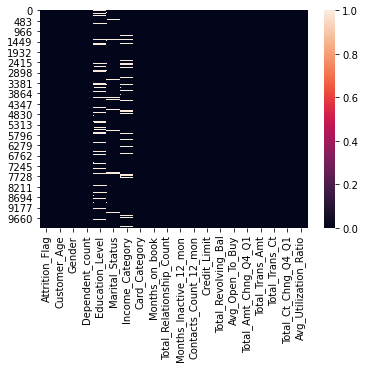

In [13]:
sb.heatmap(df.isna())

- Analyse de fond

In [14]:
#visualisation de la donnée cible

df['Attrition_Flag'].value_counts(normalize=True)*100


Existing Customer    83.934038
Attrited Customer    16.065962
Name: Attrition_Flag, dtype: float64

In [15]:
#Signification des variables

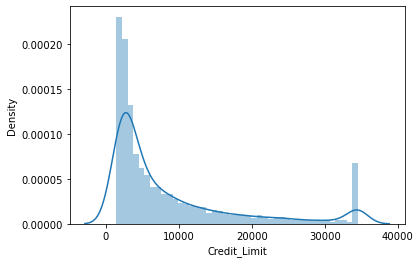

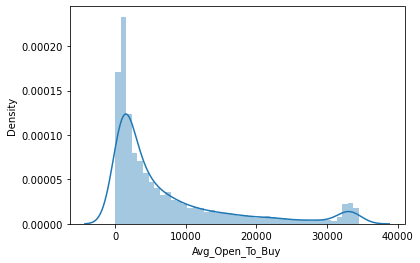

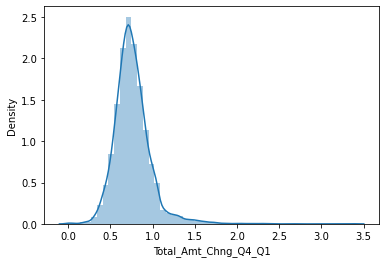

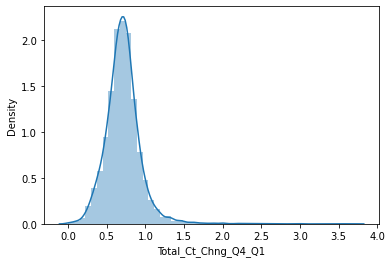

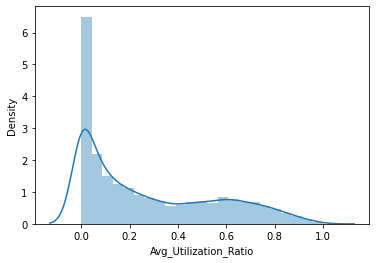

In [16]:
for col in df.select_dtypes('float'):
    plt.figure()
    sb.distplot(df[col])

In [17]:
data_quanti=df[[ 'Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon']]

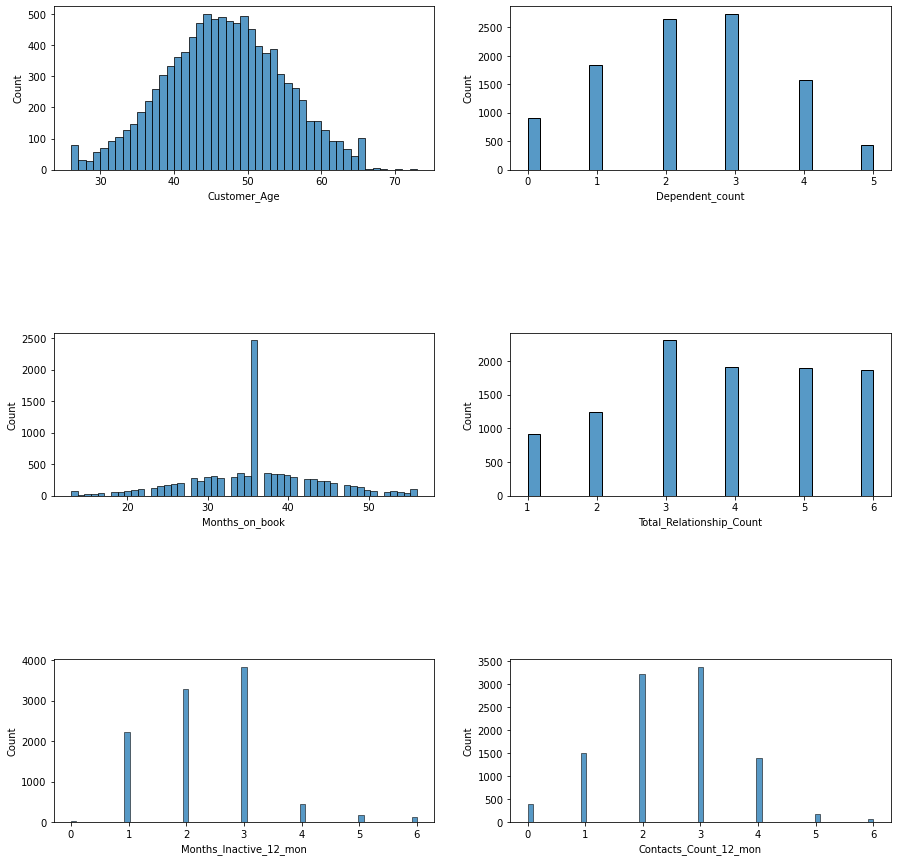

In [18]:
fig, axes = plt.subplots(3,2,figsize = (15,15)) 
for idx, cat_col in enumerate(data_quanti):
    ligne, col = idx//2, idx%2
    sb.histplot(x = cat_col, data = data_quanti, ax = axes[ligne, col])
    
    plt.subplots_adjust(hspace = 1)

In [19]:
#Variables qualitatives

In [20]:
for col in df.select_dtypes('object'):
    print(f'{col:-<50}{df[col].unique()}')

Attrition_Flag------------------------------------['Existing Customer' 'Attrited Customer']
Gender--------------------------------------------['M' 'F']
Education_Level-----------------------------------['High School' 'Graduate' 'Uneducated' nan 'College' 'Post-Graduate'
 'Doctorate']
Marital_Status------------------------------------['Married' 'Single' nan 'Divorced']
Income_Category-----------------------------------['$60K - $80K' 'Less than $40K' '$80K - $120K' '$40K - $60K' '$120K +' nan]
Card_Category-------------------------------------['Blue' 'Gold' 'Silver' 'Platinum']


In [21]:
# for col in df.select_dtypes('object').columns:
#     plt.figure()
#     df[col].value_counts().plot.pie()

In [22]:
def graphBar(variable, couleur, titre):
    ax = df[variable].value_counts().plot(kind='bar', figsize=(18,5),
                                            color=couleur, fontsize=13,);
    ax.set_alpha(0.8)
    ax.set_title(titre, fontsize=18)
    ax.set_ylabel("Nombre d'individus", fontsize=18);
    
    
    # créer une liste pour collecter les données plt.patches
    totals = []

    # trouver les valeurs et ajouter à la liste
    for i in ax.patches:
        totals.append(i.get_height())

    # set individual bar lables using above list
    total = sum(totals)

    # définir des étiquettes de barres individuelles à l'aide de la liste ci-dessus
    for i in ax.patches:
        # get_x tire vers la gauche ou vers la droite ; get_height pousse vers le haut ou vers le bas
        ax.text(i.get_x(), i.get_height()+.5, \
                str(round((i.get_height()/total)*100, 2))+'%', fontsize=15,
                    color='dimgrey')

def pieBar(variable, couleur, titre):
    fig, ax = plt.subplots(1, 2)
    graphBar(variable, couleur, titre)
    ax[0].pie(df[variable].value_counts(),
    #                labels=['absence', 'presence'],
                   colors = couleur,
    #                explode = [0, 0.05],
               autopct = '%1.2f%%',
               shadow = True)
    ax[0].set_title(titre, fontsize=18)
#     plt.savefig(f'img/{titre}.png')
    plt.show()
    print(120*'=')
from random import sample

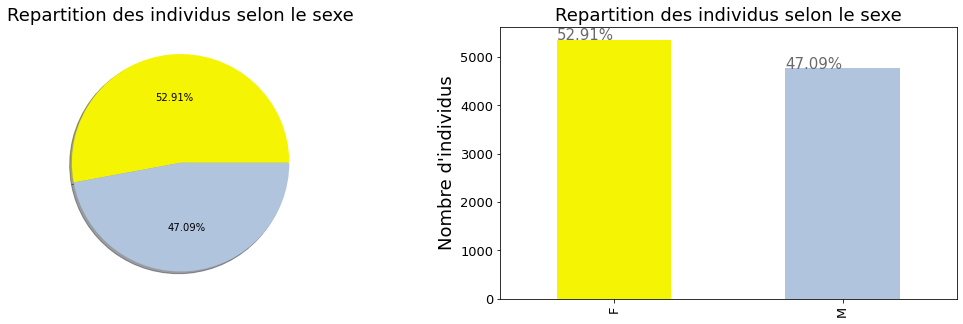

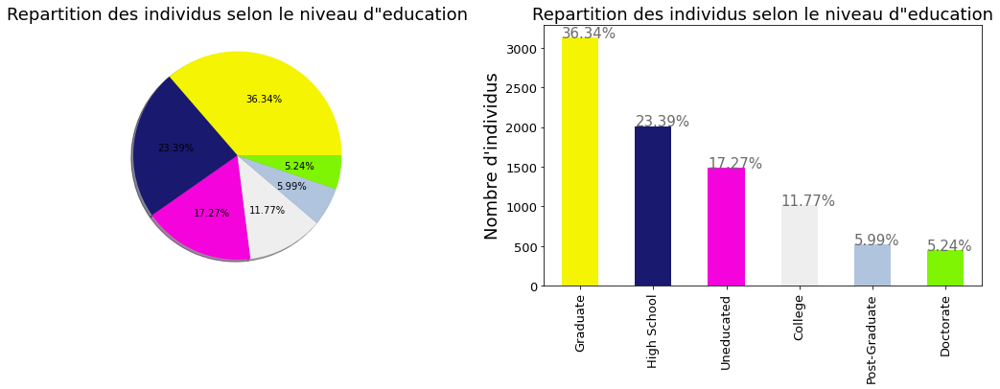

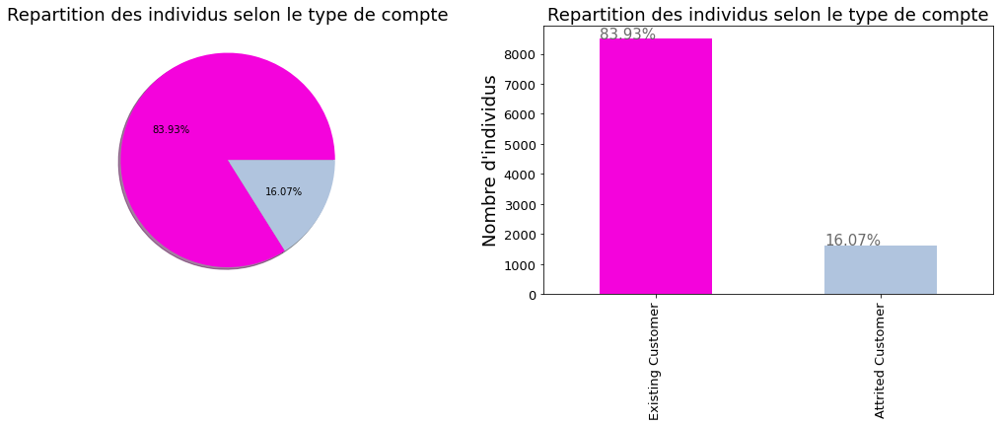

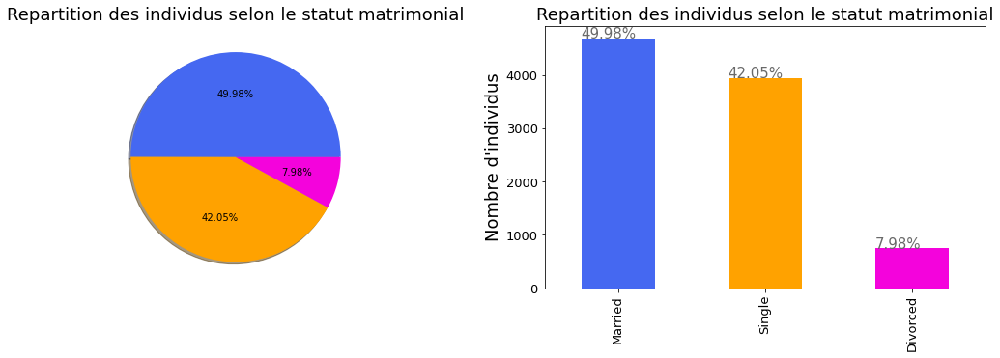

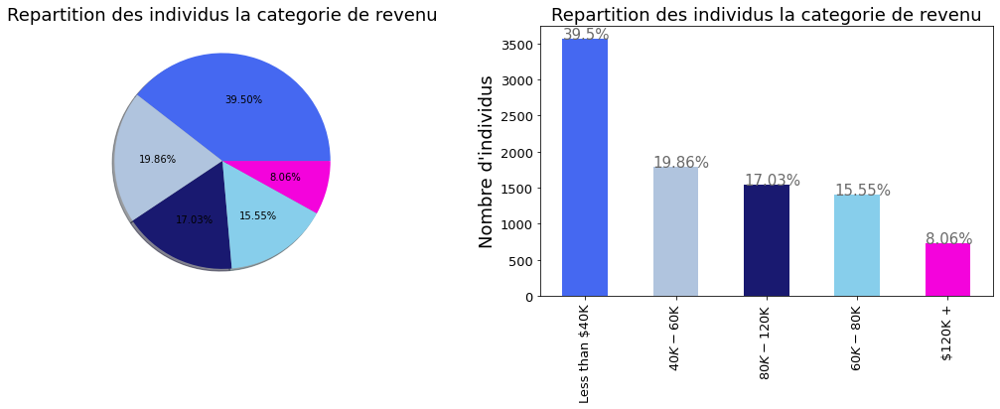

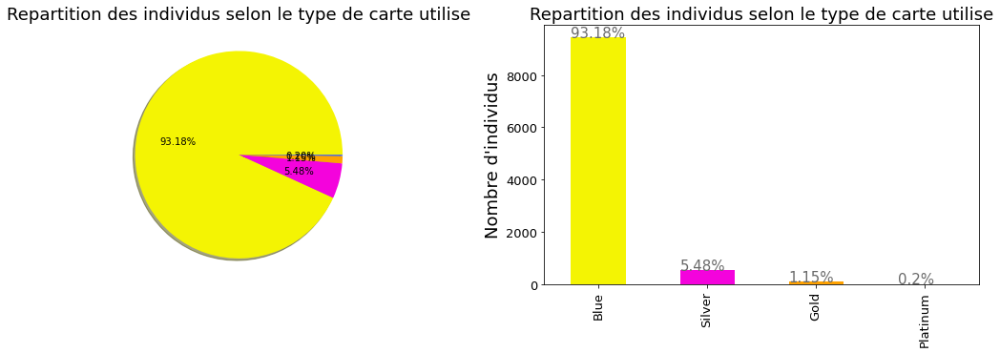

In [23]:
couleurs = ['SkyBlue', '#4568f1', '#f4f403', '#EEEEEE', '#7ff403', '#f403dc', '#ffa200', 'MidnightBlue','LightSteelBlue']

pieBar(variable='Gender', couleur=sample(couleurs, k=2), titre='Repartition des individus selon le sexe')
pieBar(variable='Education_Level', couleur=sample(couleurs, k=6), titre='Repartition des individus selon le niveau d"education')
pieBar(variable='Attrition_Flag', couleur=sample(couleurs, k=2), titre='Repartition des individus selon le type de compte')
pieBar(variable='Marital_Status', couleur=sample(couleurs, k=3), titre='Repartition des individus selon le statut matrimonial')
pieBar(variable='Income_Category', couleur=sample(couleurs, k=5), titre='Repartition des individus la categorie de revenu')
pieBar(variable='Card_Category', couleur=sample(couleurs, k=4), titre='Repartition des individus selon le type de carte utilise')

In [24]:
#Visualisation des predicteurs qualitatives  et de la variable cible

In [25]:
def bar2varible(lis_of_label, dic_of_mod, titre):
    """
    Cette fonction permet de visualiser la distribution d'une variable en fonction d'une autre à l'aide d'un digramme en 
    barre.
    :param lis_of_label: Une liste contenant les noms à mettre en abscisse
    :param dic_of_mod: Un dictionnaire donc les clés sont les labels des barres et les 
                       valeurs sont des liste contenant les effectives à représenter
    :param titre: le titre à afficher sur le graphique
    
     exemple:
         lis_of_label = ['Absence', 'Presence']
         dic_of_mod = {'Homme': [12, 57], 'Femme': [55, 102]}
    """
    
    couleurs = ['SkyBlue', '#4568f1', '#f4f403', '#EEEEEE', '#7ff403', '#f403dc', '#ffa200', 'MidnightBlue','LightSteelBlue']
    
    labels = lis_of_label
    bar_labels = []
    bars = []
    value_bar_sum = []
    
    for key, value in dic_of_mod.items():
        bar_labels.append(key)
        bars.append(value)

    x = np.arange(len(labels))  # les coordonnées des abscisses x des bâtons
    width = 0.35  # largeur des bâtons 

    fig, ax = plt.subplots(figsize=(16,7))
    
    # Je trace les graphes avec un legé decalage
    for bar, bar_label, index in zip(bars, bar_labels, x):
        if index%2==0:
            ax.bar(x - width/2, bar, width, label=bar_label, color=sample(couleurs, k=1))
        else:
            ax.bar(x + width/2, bar, width, label=bar_label, color=sample(couleurs, k=1))

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel("Nombre d'individus", fontsize=18)
    ax.set_title(titre, fontsize=18, fontweight='500', color='#000', pad=15)
    ax.set_xticks(x)
    ax.set_xticklabels(labels)
    ax.legend()

    # # ax.bar_label(rects1, padding=3)
    # # ax.bar_label(rects2, padding=3)
    
   # plt.savefig(f'img/{titre}.png')
    fig.tight_layout()
    plt.show()

In [26]:
def var_stat_group(var_1, list_mod_in_var_1, var_2, list_mod_in_var_2):
    """
    exemple param:  'coeur', ['absence', 'presence'], 'vaisseau', ['A', 'B', 'C', 'D']
    
            sortir   {'absence_vaisseau_A': 120,
                     'absence_vaisseau_B': 20,
                     'absence_vaisseau_C': 7,
                     'absence_vaisseau_D': 3,
                     'presence_vaisseau_A': 40,
                     'presence_vaisseau_B': 38,
                     'presence_vaisseau_C': 26,
                     'presence_vaisseau_D': 16}
    :return dic:     
    """
    dic = {}
    for i in list_mod_in_var_1:
        for j in list_mod_in_var_2:
            dic[f'{i}_{var_2}_{j}'] = ((df[var_1]==i)&(df[var_2]==j)).sum()
            dic[f'{i}_{var_2}_{j}'] = ((df[var_1]==i)&(df[var_2]==j)).sum()
        
    return dic

In [27]:
dic = var_stat_group('Gender', ['M' ,'F'], 'Attrition_Flag', ['Existing Customer', 'Attrited Customer'])
dic

{'M_Attrition_Flag_Existing Customer': 4072,
 'M_Attrition_Flag_Attrited Customer': 697,
 'F_Attrition_Flag_Existing Customer': 4428,
 'F_Attrition_Flag_Attrited Customer': 930}

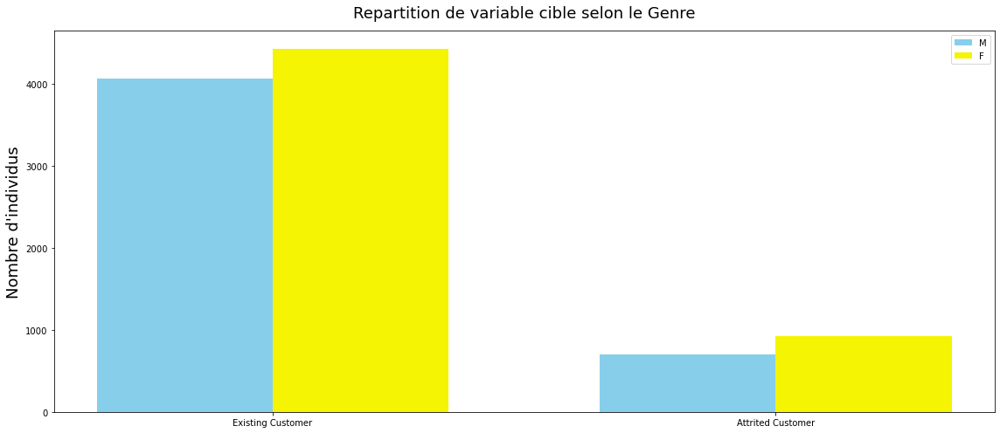

In [28]:
labels = ['Existing Customer', 'Attrited Customer']
masculin = [dic['M_Attrition_Flag_Existing Customer'], dic['M_Attrition_Flag_Attrited Customer']]
feminin = [dic['F_Attrition_Flag_Existing Customer'], dic['F_Attrition_Flag_Attrited Customer']]
title = 'Repartition de variable cible selon le Genre'

variable_mod = {'M': masculin, 'F': feminin}
bar2varible(lis_of_label=labels, dic_of_mod=variable_mod, titre=title)

In [29]:
# conda install -c conda-forge dataprep dans l'environnement de python(installation)
from dataprep.eda import *

DataPrep Report
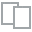
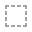
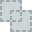
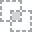
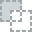
...
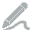
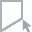
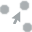
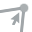
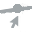

In [30]:
create_report(df)

# III.DATA PREPROCESSING

- Imputation 

Les données manquantes se trouve au niveau de trois  variables qualitatives, nous choisissons d'imputer donc par le mode

In [31]:
#separation du jeu de donnée

In [32]:
##target
y=df["Attrition_Flag"]

In [33]:
y.replace({'Existing Customer':0,'Attrited Customer':1},inplace=True)
df.drop("Attrition_Flag",axis=1,inplace=True)

In [34]:
df_train,df_test,y_train,y_test = train_test_split(df,y,test_size=0.3,random_state=42)

In [35]:
#Imputation dans le jeu d'entrainement
for i in list(df_test.columns)[1:-1]:
    if df_train[i].dtype == 'object':
        #imputation par le mode des colonnes qualitatives
        df_train[i].fillna(value=df_train[i].mode()[0],inplace=True)    

In [36]:
df_train.isna().sum()/df_train.shape[0]*100

Customer_Age                0.0
Gender                      0.0
Dependent_count             0.0
Education_Level             0.0
Marital_Status              0.0
Income_Category             0.0
Card_Category               0.0
Months_on_book              0.0
Total_Relationship_Count    0.0
Months_Inactive_12_mon      0.0
Contacts_Count_12_mon       0.0
Credit_Limit                0.0
Total_Revolving_Bal         0.0
Avg_Open_To_Buy             0.0
Total_Amt_Chng_Q4_Q1        0.0
Total_Trans_Amt             0.0
Total_Trans_Ct              0.0
Total_Ct_Chng_Q4_Q1         0.0
Avg_Utilization_Ratio       0.0
dtype: float64

- Encodage des variables qualitatives

In [37]:
X_cat = df_train.select_dtypes(object)
X_num = df_train.select_dtypes(exclude=object)

In [38]:
X_cat["Income_Category"].replace({"Less than $40K":0,"$40K - $60K":1,"$60K - $80K":2,"$80K - $120K":3,"$120K +":4},inplace=True)

In [39]:
X_cat["Card_Category"].replace({"Blue":0,"Silver":1,"Gold":2,"Platinum":3},inplace=True)
X_cat["Education_Level"].replace({"Uneducated":0,"College":1,"High School":2,"Graduate":3,"Post-Graduate":4,"Doctorate":5},inplace=True)

In [40]:
def categorie_encoder(data,cat_feature):
    for col in cat_feature:
        dummy_data=pd.get_dummies(data[col], dummy_na=False, drop_first=True)
        data=data.drop(col, axis='columns')
        data=pd.concat([data,dummy_data], axis='columns')
    return data

In [41]:
X_cat=categorie_encoder(X_cat,['Gender','Marital_Status'])

In [42]:
X_cat

,Education_Level,Income_Category,Card_Category,M,Married,Single
415,4,2,0,1,1,0
3749,2,0,0,0,0,1
9295,1,3,1,1,1,0
8290,3,0,0,0,1,0
7672,2,0,0,0,0,1
...,...,...,...,...,...,...
5734,3,1,0,0,0,1
5191,2,0,0,0,0,0
5390,3,0,0,0,1,0
860,3,1,0,1,0,1


- Normalisation des variables quantitatives

In [43]:
normaliser = StandardScaler()
X_num[X_num.columns] = normaliser.fit_transform(X_num)

In [44]:
X_train = pd.concat([X_num, X_cat], axis=1)
X_train

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Education_Level,Income_Category,Card_Category,M,Married,Single
415,0.335193,-0.254374,0.255868,-0.514072,-0.337527,-2.228355,-0.059174,0.986865,-0.148263,-0.570385,-0.903179,-1.654908,-1.126815,-0.110932,4,2,0,1,1,0
3749,1.824522,-1.811368,1.869934,0.127997,-0.337527,-0.409541,-0.014979,-1.426588,0.113744,-0.394194,-0.161443,0.075285,-0.937465,-0.996749,2,0,0,0,0,1
9295,-2.395242,-1.811368,-2.103152,-1.798211,-1.322454,0.499866,2.869310,-0.037471,2.874461,-0.208729,2.975581,1.974276,0.160761,-0.876453,1,3,1,1,1,0
8290,0.707525,-1.032871,0.007550,-1.798211,-1.322454,0.499866,-0.617091,1.664842,-0.767704,0.064831,0.046881,-0.177914,1.351559,2.021589,3,0,0,0,1,0
7672,-0.285360,0.524124,0.007550,-1.156142,0.647401,0.499866,-0.707031,-1.426588,-0.578735,-0.343191,-0.557228,-0.853111,-0.440949,-0.996749,2,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5734,-0.285360,-1.032871,0.255868,-0.514072,-0.337527,2.318680,-0.495029,1.664842,-0.645567,0.227112,-0.678630,-0.895311,0.510006,1.219615,3,1,0,0,0,1
5191,0.831636,0.524124,0.007550,0.127997,0.647401,3.228087,-0.074459,-1.426588,0.054227,-0.969134,-0.630823,-0.979711,-1.682240,-0.996749,2,0,0,0,0,0
5390,-0.533581,1.302621,-0.489086,-0.514072,-1.322454,-0.409541,-0.697505,0.473469,-0.740660,0.203929,0.067163,0.370683,1.212702,1.441981,3,0,0,0,1,0
860,-0.781803,0.524124,-0.985722,0.127997,-1.322454,-1.318948,-0.559161,0.669984,-0.619964,-1.177782,-0.858849,-0.979711,-1.682240,0.749367,3,1,0,1,0,1


In [45]:
from sklearn.feature_selection import SelectKBest,f_classif,chi2



In [46]:
#Select top 7 variables

selector = SelectKBest(f_classif, k =7)
selector.fit(X_train, y_train)
#X_train.columns[selector.pvalues_<0.001]
X_train.columns[selector.get_support()]
#print(selector.pvalues_)

Index(['Months_Inactive_12_mon', 'Contacts_Count_12_mon',
       'Total_Revolving_Bal', 'Total_Trans_Amt', 'Total_Trans_Ct',
       'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

In [47]:
selector = SelectKBest(chi2, k ='all')
selector.fit(X_cat, y_train)
print(selector.pvalues_)

[0.0554636  0.01986161 0.46845857 0.00284653 0.41089741 0.49109425]


In [48]:
print(X_cat.columns[selector.pvalues_<0.001])

Index([], dtype='object')


In [49]:
#selection des variables 

from sklearn.feature_selection import SelectFwe, f_classif,chi2
sel=SelectFwe(chi2,alpha=0.001)
sel.fit(X_cat,y_train)

SelectFwe(alpha=0.001, score_func=<function chi2 at 0x00000154B4978430>)

In [50]:
#Liste des variables selectionnées
print(X_cat.columns[sel.pvalues_<0.001])

Index([], dtype='object')


In [51]:
#Imputation dans la donnée de test 

for i in list(df_test.columns)[1:-1]:
    if df_test[i].dtype == 'object':
        #imputation par le mode des colonnes qualitatives
        df_test[i].fillna(value=df_test[i].mode()[0],inplace=True)  
        

In [52]:
X_cat = df_test.select_dtypes(object)
X_num = df_test.select_dtypes(exclude=object)

In [53]:
X_cat["Income_Category"].replace({"Less than $40K":0,"$40K - $60K":1,"$60K - $80K":2,"$80K - $120K":3,"$120K +":4},inplace=True)

In [54]:
X_cat["Card_Category"].replace({"Blue":0, "Silver":1, "Gold":2, "Platinum":3},inplace=True)
X_cat["Education_Level"].replace({"Uneducated":0,"College":1,"High School":2,"Graduate":3,"Post-Graduate":4,"Doctorate":5},inplace=True)

In [55]:
X_cat=categorie_encoder(X_cat,['Gender','Marital_Status'])
X_cat

,Education_Level,Income_Category,Card_Category,M,Married,Single
3781,0,0,0,0,0,1
2922,0,0,0,1,0,1
5070,3,0,0,0,0,0
7246,5,1,0,1,0,0
623,3,3,0,1,0,1
...,...,...,...,...,...,...
6621,2,2,0,1,0,1
9535,3,2,2,1,0,1
4638,5,3,0,1,0,1
1166,3,0,0,0,1,0


In [56]:
#Normalisation des données quantitatives

In [57]:
X_num[X_num.columns] = normaliser.fit_transform(X_num)

In [58]:
X_test= pd.concat([X_num, X_cat], axis=1)
X_test

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Education_Level,Income_Category,Card_Category,M,Married,Single
3781,0.203503,0.457277,0.395767,0.103186,0.662759,1.367324,-0.616603,0.418925,-0.652343,-0.249832,-0.175181,-0.001106,0.706056,0.809579,0,0,0,0,0,1
2922,1.592420,-1.045876,2.184983,0.749748,2.663875,1.367324,-0.703198,0.493614,-0.745359,-0.236628,-0.090634,0.653473,0.015808,1.570029,0,0,0,1,0,1
5070,-1.185414,-0.294299,0.012364,0.103186,0.662759,0.475438,-0.752836,-0.219000,-0.731947,0.524826,0.129004,0.129810,0.839922,1.042736,3,0,0,0,0,0
7246,0.077238,0.457277,0.012364,0.103186,-0.337799,0.475438,-0.422061,0.428720,-0.459066,0.793316,0.204361,0.435280,0.572190,0.138804,5,1,0,1,0,0
623,-0.554088,0.457277,-0.371040,-0.543376,0.662759,-0.416448,-0.538244,1.229493,-0.645746,-1.037695,-0.873613,-1.266624,-0.799939,1.096541,3,3,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6621,0.329769,1.208854,-0.754443,0.749748,0.662759,0.475438,-0.769635,-0.325525,-0.739302,-0.738395,0.014743,0.260726,-0.026025,1.046323,2,2,0,1,0,1
9535,-0.932883,-1.045876,0.012364,-1.836500,0.662759,-0.416448,2.800068,0.607486,2.740664,-0.038562,2.840329,1.788076,-0.410890,-0.826108,3,2,2,1,0,1
4638,1.213625,-0.294299,1.545977,0.103186,0.662759,0.475438,-0.455225,1.590698,-0.594803,0.053869,-0.298632,0.435280,-0.130608,0.974582,5,3,0,1,0,1
1166,-1.059148,-0.294299,0.012364,1.396310,0.662759,1.367324,-0.646299,0.520552,-0.690955,3.680678,-0.686752,-1.353901,1.459054,1.103715,3,0,0,0,1,0


In [59]:
X_test.loc[10123,:]

Customer_Age               -0.680353
Dependent_count            -0.294299
Months_on_book             -1.393449
Total_Relationship_Count    0.103186
Months_Inactive_12_mon     -0.337799
Contacts_Count_12_mon       0.475438
Credit_Limit               -0.477226
Total_Revolving_Bal         1.249084
Avg_Open_To_Buy            -0.586584
Total_Amt_Chng_Q4_Q1        0.194716
Total_Trans_Amt             1.365658
Total_Trans_Ct              0.217087
Total_Ct_Chng_Q4_Q1        -0.126425
Avg_Utilization_Ratio       0.834688
Education_Level             3.000000
Income_Category             1.000000
Card_Category               0.000000
M                           1.000000
Married                     0.000000
Single                      0.000000
Name: 10123, dtype: float64

# IV.  MODELISATION ET EVALUATION 

In [60]:
#models de machine learning pour la situation

models={'LogisticRegression':LogisticRegression(random_state=42),
        'RandomForestClassifier':RandomForestClassifier(max_depth=1,n_estimators=100,random_state=42,min_samples_split=2, min_samples_leaf=1,
max_features='auto', max_leaf_nodes=None,bootstrap=True, oob_score=True),
        'BaggingClassifier':BaggingClassifier(base_estimator=RandomForestClassifier()),
        'KNeighborsClassifier':KNeighborsClassifier(),
        'SVC':SVC(kernel = 'rbf', random_state= 42)
        }

#fonction d'evaluation des modeles

from sklearn.model_selection import learning_curve

def evaluation(models,X_train,y_train,X_test,y_test):
    for name,model in models.items():
        print(name,':')
        model.fit(X_train,y_train)
        print(classification_report(y_test,model.predict(X_test)))
        N,train_score,val_score=learning_curve(model,X_train,y_train,train_sizes=np.linspace(0.1,1.0,10),cv=5,scoring='recall')
        plt.figure(figsize=(12,8))
        plt.title('courbe de validation du model')
        plt.plot(N,train_score.mean(axis=1),label="train")
        plt.plot(N,val_score.mean(axis=1),label="validation")
        plt.xlabel('train_size')
        plt.legend()
        plt.show()
        print('-'*50)

LogisticRegression :
              precision    recall  f1-score   support

           0       0.92      0.97      0.94      2543
           1       0.77      0.54      0.63       496

    accuracy                           0.90      3039
   macro avg       0.84      0.75      0.79      3039
weighted avg       0.89      0.90      0.89      3039



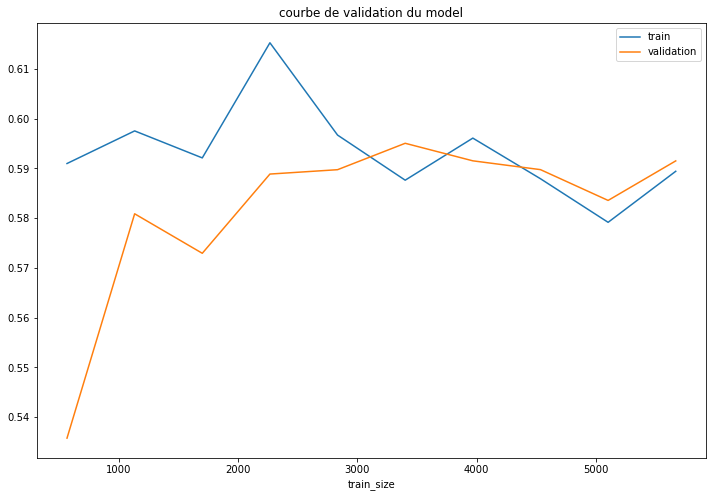

--------------------------------------------------
RandomForestClassifier :
              precision    recall  f1-score   support

           0       0.84      1.00      0.91      2543
           1       0.00      0.00      0.00       496

    accuracy                           0.84      3039
   macro avg       0.42      0.50      0.46      3039
weighted avg       0.70      0.84      0.76      3039



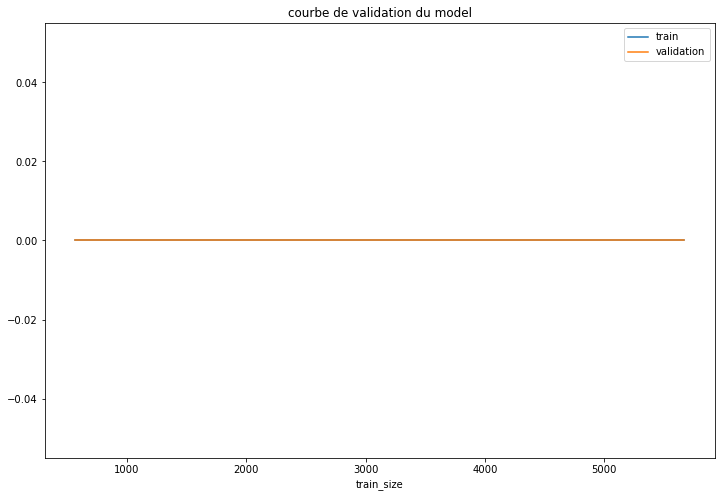

--------------------------------------------------
BaggingClassifier :
              precision    recall  f1-score   support

           0       0.95      0.99      0.97      2543
           1       0.94      0.74      0.83       496

    accuracy                           0.95      3039
   macro avg       0.95      0.87      0.90      3039
weighted avg       0.95      0.95      0.95      3039



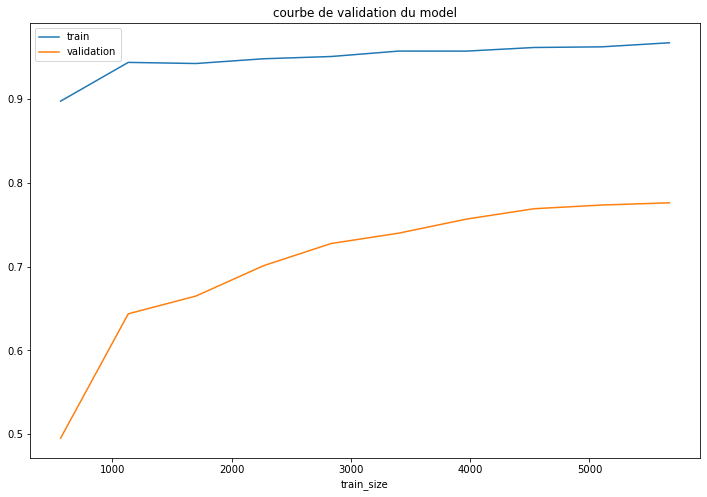

--------------------------------------------------
KNeighborsClassifier :
              precision    recall  f1-score   support

           0       0.92      0.98      0.95      2543
           1       0.84      0.54      0.66       496

    accuracy                           0.91      3039
   macro avg       0.88      0.76      0.80      3039
weighted avg       0.90      0.91      0.90      3039



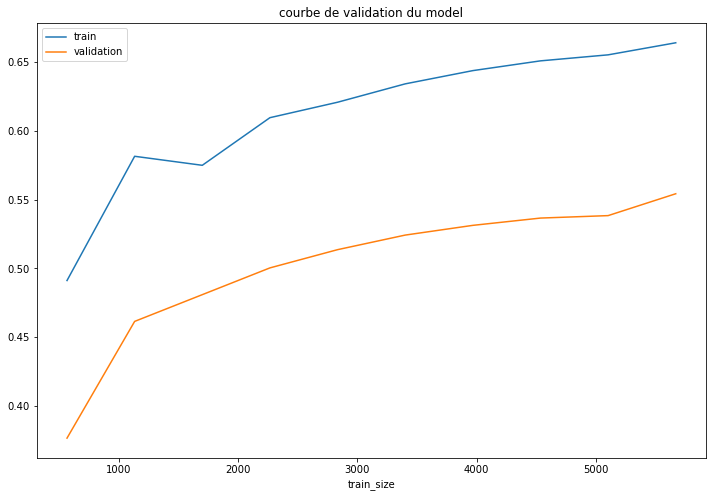

--------------------------------------------------
SVC :
              precision    recall  f1-score   support

           0       0.93      0.98      0.96      2543
           1       0.89      0.65      0.75       496

    accuracy                           0.93      3039
   macro avg       0.91      0.81      0.85      3039
weighted avg       0.93      0.93      0.92      3039



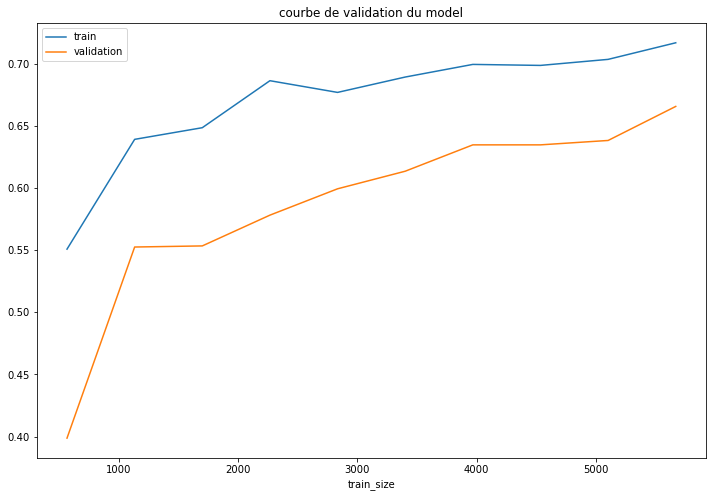

--------------------------------------------------


In [61]:
evaluation(models,X_train,y_train,X_test,y_test)

In [62]:
#on retient le modele de Bagging 

In [63]:
#Le modèle de bagging présente les meilleures performances. 


In [64]:
X_train=X_train[['Months_Inactive_12_mon', 'Contacts_Count_12_mon',
       'Total_Revolving_Bal', 'Total_Trans_Amt', 'Total_Trans_Ct',
       'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']]



X_test=X_test[['Months_Inactive_12_mon', 'Contacts_Count_12_mon',
       'Total_Revolving_Bal', 'Total_Trans_Amt', 'Total_Trans_Ct',
       'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']]


In [65]:
X_train

,Months_Inactive_12_mon,Contacts_Count_12_mon,Total_Revolving_Bal,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
415,-0.337527,-2.228355,0.986865,-0.903179,-1.654908,-1.126815,-0.110932
3749,-0.337527,-0.409541,-1.426588,-0.161443,0.075285,-0.937465,-0.996749
9295,-1.322454,0.499866,-0.037471,2.975581,1.974276,0.160761,-0.876453
8290,-1.322454,0.499866,1.664842,0.046881,-0.177914,1.351559,2.021589
7672,0.647401,0.499866,-1.426588,-0.557228,-0.853111,-0.440949,-0.996749
...,...,...,...,...,...,...,...
5734,-0.337527,2.318680,1.664842,-0.678630,-0.895311,0.510006,1.219615
5191,0.647401,3.228087,-1.426588,-0.630823,-0.979711,-1.682240,-0.996749
5390,-1.322454,-0.409541,0.473469,0.067163,0.370683,1.212702,1.441981
860,-1.322454,-1.318948,0.669984,-0.858849,-0.979711,-1.682240,0.749367


In [66]:
X_test

,Months_Inactive_12_mon,Contacts_Count_12_mon,Total_Revolving_Bal,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
3781,0.662759,1.367324,0.418925,-0.175181,-0.001106,0.706056,0.809579
2922,2.663875,1.367324,0.493614,-0.090634,0.653473,0.015808,1.570029
5070,0.662759,0.475438,-0.219000,0.129004,0.129810,0.839922,1.042736
7246,-0.337799,0.475438,0.428720,0.204361,0.435280,0.572190,0.138804
623,0.662759,-0.416448,1.229493,-0.873613,-1.266624,-0.799939,1.096541
...,...,...,...,...,...,...,...
6621,0.662759,0.475438,-0.325525,0.014743,0.260726,-0.026025,1.046323
9535,0.662759,-0.416448,0.607486,2.840329,1.788076,-0.410890,-0.826108
4638,0.662759,0.475438,1.590698,-0.298632,0.435280,-0.130608,0.974582
1166,0.662759,1.367324,0.520552,-0.686752,-1.353901,1.459054,1.103715


In [67]:
bagging= BaggingClassifier(base_estimator=RandomForestClassifier())
model_bag=bagging.fit(X_train, y_train)
y_pred=model_bag.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.95      0.98      0.97      2543
           1       0.90      0.75      0.82       496

    accuracy                           0.95      3039
   macro avg       0.93      0.87      0.89      3039
weighted avg       0.94      0.95      0.94      3039



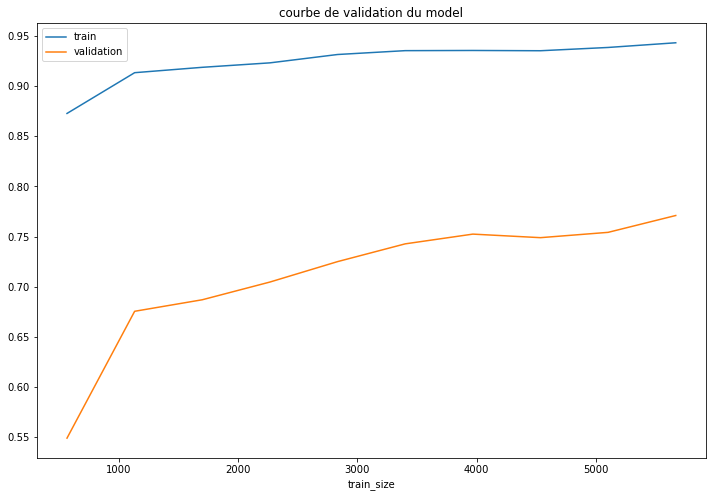

In [68]:
N,train_score,val_score=learning_curve(bagging,X_train,y_train,train_sizes=np.linspace(0.1,1.0,10),cv=5,scoring='recall')
plt.figure(figsize=(12,8))
plt.title('courbe de validation du model')
plt.plot(N,train_score.mean(axis=1),label="train")
plt.plot(N,val_score.mean(axis=1),label="validation")
plt.xlabel('train_size')
plt.legend()
plt.show()

In [69]:
bagging= BaggingClassifier(base_estimator=RandomForestClassifier())
bagging.fit(X_train, y_train)

BaggingClassifier(base_estimator=RandomForestClassifier())

# V.DEPLOIEMENT DU MODELE DE BAGGING

- Enregistrement du modele

In [70]:
import pickle

In [71]:
pickle.dump(bagging,open('model.pkl','wb'))